## Load data into AnnData object

In [21]:
import scanpy as sc
import anndata as ad
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt
import scvi
import torch


In [4]:
adata = ad.read_h5ad('../../Data/batch_integration_1-3_cd4_t_subset_batch1.h5ad')

In [5]:
sc.set_figure_params(dpi=50, facecolor="white") 


In [6]:
print(adata.obs["pica_id"].value_counts())
adata

pica_id
PICA0001    2407
PICA0007    1879
PICA0006    1633
PICA0003    1216
PICA0004    1214
PICA0002    1022
PICA0005     688
Name: count, dtype: int64


AnnData object with n_obs × n_vars = 10059 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_

## Define Mt, Rb, Hb genes and Calculate QC metrics

## Visualize QC metrics

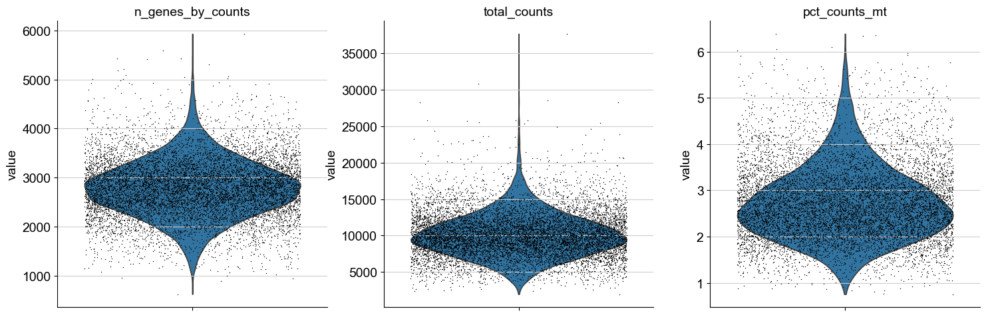

In [7]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

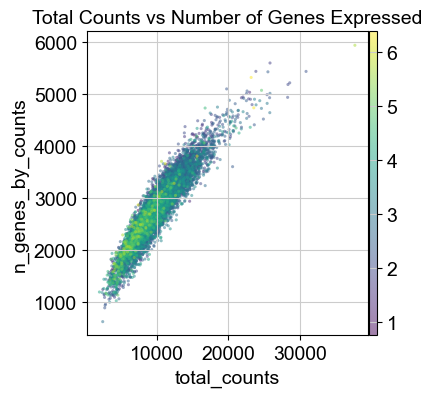

In [8]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt', title='Total Counts vs Number of Genes Expressed', alpha=0.5, size=20)

## Filter to keep good quality cells/genes if needed
Remove cells with less than 100 genes and remove genes not present in more than 3 cells
Remove cells that has more than 5% of mt expression

## Doublet detection
Scrublet
output: doublet_score and predicted_doublet in .obs
Use score during clustering to filter clusters with high doublet scores

## Normalization

In [9]:
adata.layers['counts'] = adata.X.copy()  # Store raw counts in a separate layer

In [10]:
sc.pp.normalize_total(adata)  # default count to 1e4
sc.pp.log1p(adata)

## Feature selection
Reduce dimensionality of dataset to only include informative genes

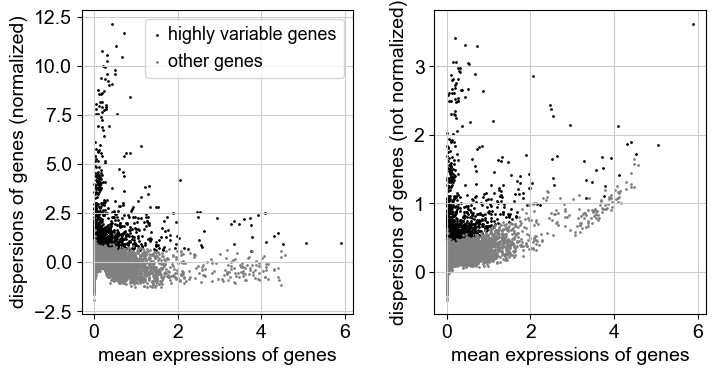

In [11]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key='pica_id')
sc.pl.highly_variable_genes(adata)

In [12]:
print(adata.var.highly_variable.sum())


2000


## Dimensionality reduction
How many PCs to consider to compute neighbourhood relation of cells
Used in clustering function leiden()

In [13]:
sc.tl.pca(adata)

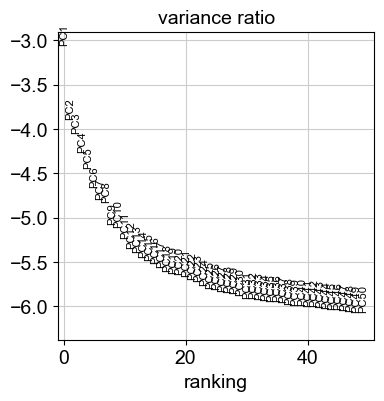

In [14]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

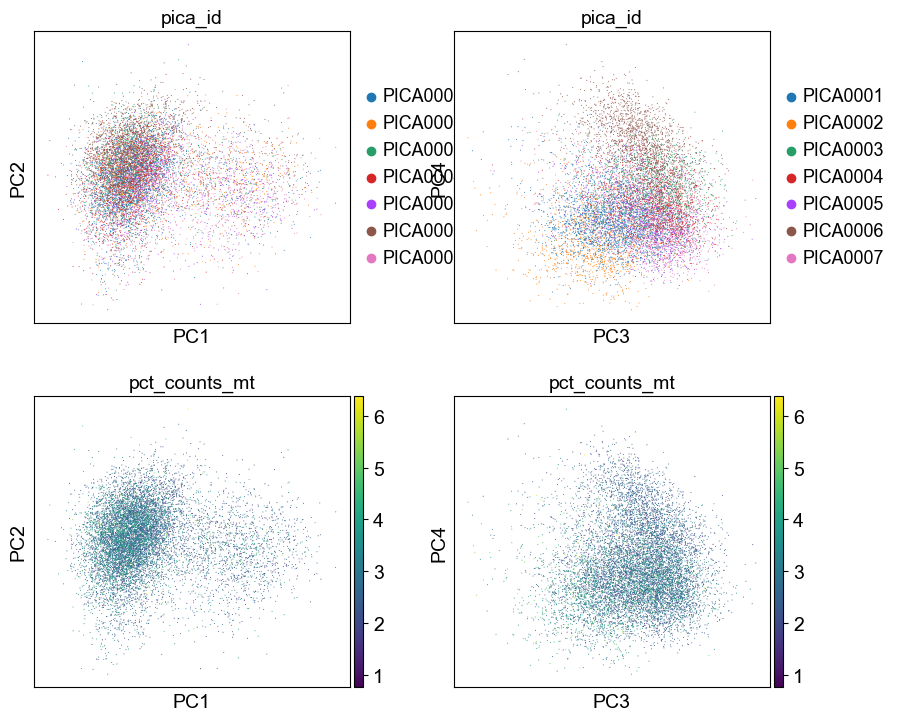

In [15]:
# Check PCA results for undesired technical artifacts like batch effects or mitochondrial stress
sc.pl.pca(
    adata,
    color=["pica_id", "pica_id", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

## Nearest neighbour graph construction and visualization
using PCA results

In [16]:
sc.pp.neighbors(adata)

In [17]:
sc.tl.umap(adata)

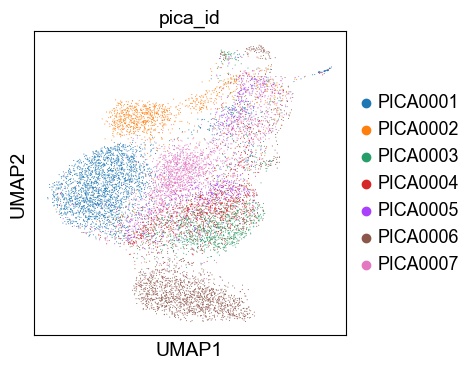

In [18]:
sc.pl.umap(
    adata,
    color="pica_id",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

## Clustering
Leiden graph-clustering method (community detection based on optimizing modularit) like in Seurat

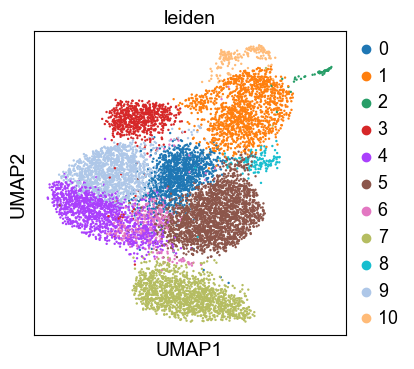

In [19]:
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)
sc.pl.umap(adata, color=["leiden"])

saving figure to file /Users/jessica/Documents/GitHub/Jessica_notebooks/figures/umapbatch1_leiden_pica_id_umap.png


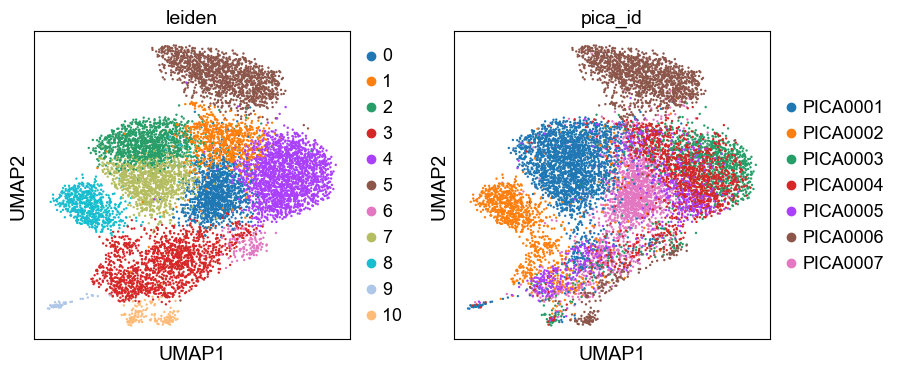

In [27]:
sc.pl.umap(adata, color = ['leiden','pica_id'], save='batch1_leiden_pica_id_umap.png')

Batch integration?

/Users/jessica/mambaforge/envs/scanpy/lib/python3.10/site-packages/scvi/train/_trainrunner.py:69: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  accelerator, lightning_devices, device = parse_device_args(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/jessica/mambaforge/envs/scanpy/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Users/jessica/mambaforge/envs/scanpy/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `D

Epoch 400/400: 100%|██████████| 400/400 [12:11:02<00:00, 32.36s/it, v_num=1, train_loss_step=7.87e+3, train_loss_epoch=7.77e+3]      

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [12:11:02<00:00, 109.66s/it, v_num=1, train_loss_step=7.87e+3, train_loss_epoch=7.77e+3]


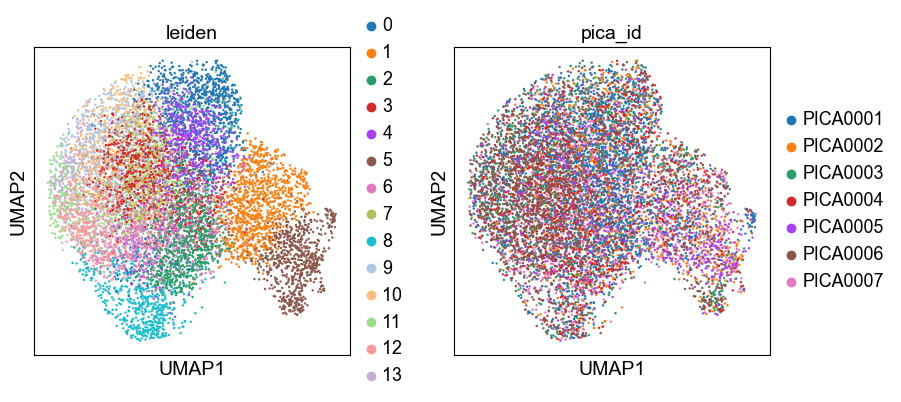

In [78]:

adata_uncorrected = adata.copy()

adata.raw = adata

scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="pica_id")

# 4. Train the scVI model
model = scvi.model.SCVI(adata)
model.train()

adata.obsm["X_scVI"] = model.get_latent_representation()

#  latent representation 
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)
sc.tl.leiden(adata)


sc.pl.umap(adata, color=["leiden", "pica_id"], save="scvi_integrated_umap.png")


In [ ]:

sc.tl.paga(adata, groups='leiden')

pd.crosstab(adata.obs['pica_id'], adata.obs['leiden'], normalize= 'index')

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13
pica_id,,,,,,,,,,,,,,
PICA0001,0.202327,0.073536,0.140424,0.095555,0.067304,0.034483,0.055256,0.057748,0.055256,0.024927,0.054840,0.069796,0.015372,0.053178
PICA0002,0.149706,0.122309,0.127202,0.062622,0.099804,0.157534,0.047945,0.056751,0.050881,0.020548,0.041096,0.033268,0.016634,0.013699
PICA0003,0.087171,0.076480,0.055921,0.072368,0.092928,0.055921,0.063322,0.053454,0.067434,0.110197,0.064145,0.069901,0.071546,0.059211
PICA0004,0.094728,0.102142,0.100494,0.073311,0.108731,0.029654,0.098023,0.082372,0.065074,0.075783,0.037891,0.046952,0.057661,0.027183
PICA0005,0.065407,0.143895,0.093023,0.059593,0.066860,0.204942,0.040698,0.063953,0.043605,0.062500,0.066860,0.011628,0.052326,0.024709
PICA0006,0.017146,0.077159,0.012247,0.148806,0.033068,0.055113,0.109614,0.046540,0.058175,0.131660,0.063686,0.059400,0.099204,0.088181
PICA0007,0.068654,0.164981,0.083023,0.070782,0.076104,0.079297,0.067057,0.080362,0.075040,0.022885,0.080362,0.072379,0.039383,0.019691


## Re-assess qc and cell filtering

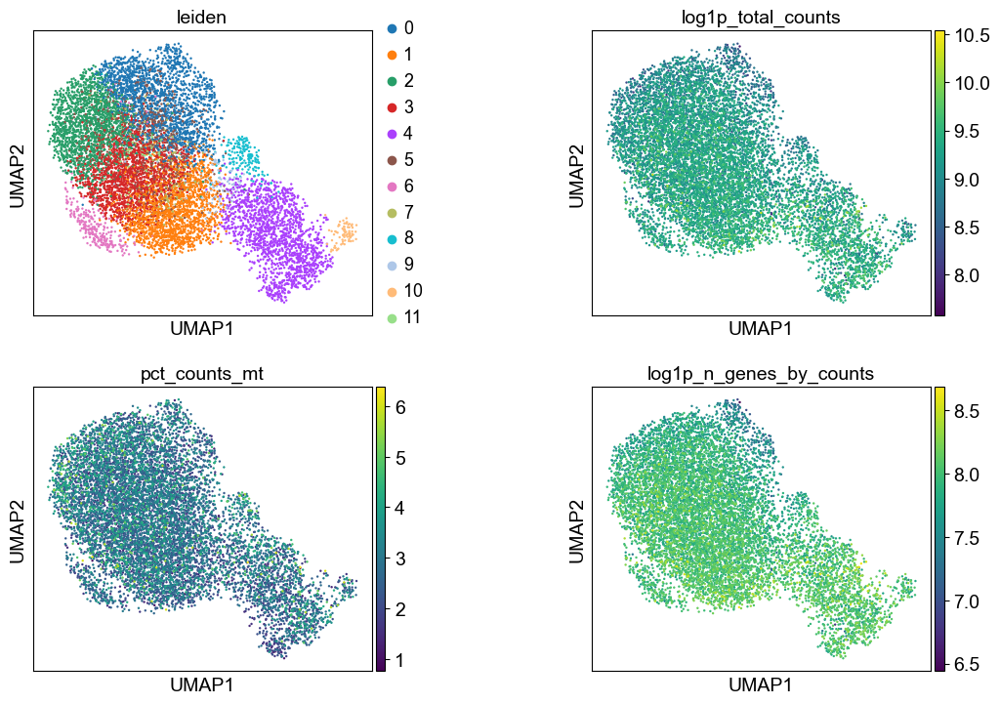

In [31]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

## Annotation

### Optimising Clustering
different resolutions

In [32]:
# Test different resolutions for Leiden clustering
# Higher resolution will result in more clusters, lower resolution will result in fewer clusters
for res in [0.02, 0.5, 1.0, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

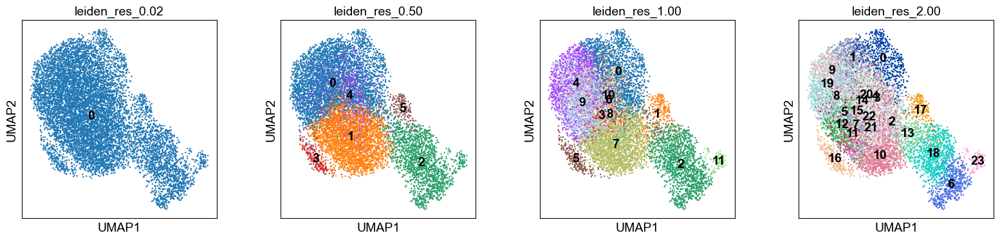

In [33]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.02", "leiden_res_0.50", "leiden_res_1.00", "leiden_res_2.00"],
    legend_loc="on data",
)

Plot known marker genes to see if they align with your clusters
Cluster sizes

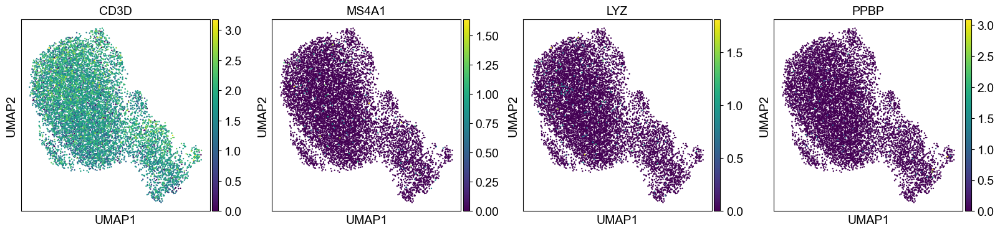

leiden
0     1795
1     1691
2     1681
3     1653
4     1577
5      727
6      264
7      219
8      176
9      130
10      78
11      68
Name: count, dtype: int64

In [34]:
sc.pl.umap(adata, color=["CD3D", "MS4A1", "LYZ", "PPBP"])  # example for T-cells, B-cells, monocytes, platelets
adata.obs["leiden"].value_counts()      # Check cluster sizes




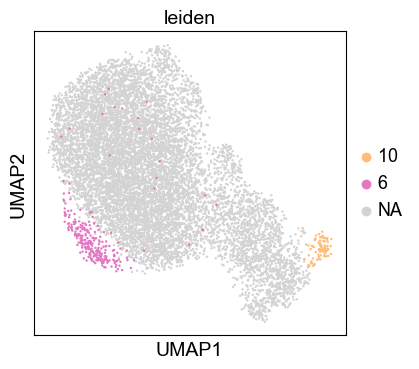

In [35]:
sc.pl.umap(adata, color='leiden', groups=['6', '10'])


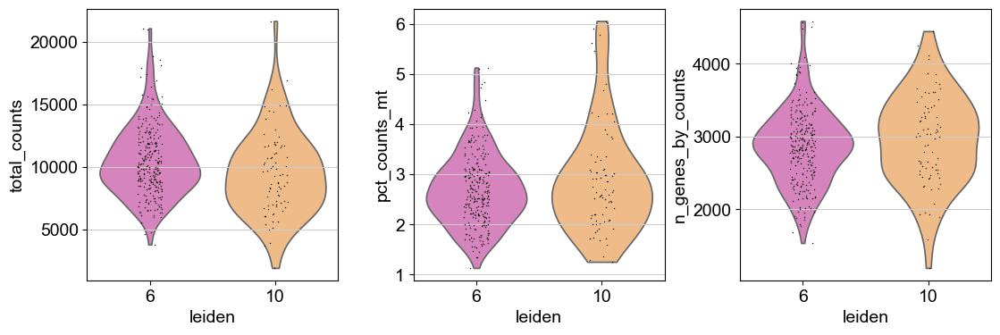

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

adata_sub = adata[adata.obs['leiden'].isin(['6', '10'])].copy()

# Violin plots for total counts, mito%, n_genes for clusters 6 and 10
sc.pl.violin(adata_sub, ['total_counts', 'pct_counts_mt', 'n_genes_by_counts'],
             groupby='leiden', multi_panel=True)

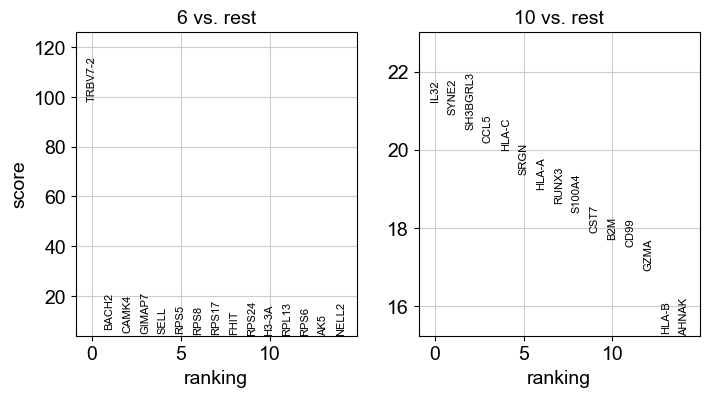

In [37]:
sc.tl.rank_genes_groups(adata, groupby='leiden', groups=['6', '10'], method='t-test')
sc.pl.rank_genes_groups(adata, groups=['6', '10'], n_genes=15, sharey=False, save='batch1_leiden_6_10_rank_genes.png')


## Marker gene list

In [38]:
import pandas as pd

# CD4 helper program (not Tfh-specific)
cd4_helper = ["IL7R","CCR7","TCF7","LEF1","SELL"]
# CD8 / cytotoxic program
cd8_cyto   = ["CD8A","CD8B","NKG7","GNLY","PRF1","GZMB"]
# MAIT markers
mait_genes = ["KLRB1","SLC4A10","IL7R","TRAV1-2","DPP4"]  # TRAV1-2 if present in your matrix
# gamma-delta T markers (often TRGV/TRDV not in RNA matrix; use proxies)
gdt_genes  = ["TRDC","TRGC1","TRGC2","KLRD1","NKG7"]

for n, g in {
    "score_cd4_helper": cd4_helper,
    "score_cd8_cyto":   cd8_cyto,
    "score_mait":       mait_genes,
    "score_gdt":        gdt_genes,
}.items():
    sc.tl.score_genes(adata, g, score_name=n)

In [39]:
is_cd4 = (adata.obs["score_cd4_helper"] > 0.2) & (adata.obs["score_cd8_cyto"] < 0.1)
is_cd8 = (adata.obs["score_cd8_cyto"]   > 0.2) & (adata.obs["score_cd4_helper"] < 0.1)

adata.obs["T_lineage"] = "T_other"
adata.obs.loc[is_cd4, "T_lineage"] = "CD4"
adata.obs.loc[is_cd8, "T_lineage"] = "CD8"

# Optional flags (don’t force into lineage, just annotate)
adata.obs["is_MAIT"] = adata.obs["score_mait"] > 0.3
adata.obs["is_gdT"]  = adata.obs["score_gdt"]  > 0.3

In [41]:
# Define marker genes for T cell subsets
tfh_panel = {
    "tfh_pos": [
        "CXCR5",
        "PDCD1",      # PD-1
        "ICOS",
        "BCL6",
        "IL21",
        "TOX2",
        "MAF",
        "CXCL13",
        "SH2D1A",     # SAP
        "BATF",
        "TNFRSF4",    # OX40
    ],
    "tfh_neg": ["PRDM1","NKG7","GNLY","GZMB"],

    "tfh1":   ["CXCR3","TBX21","IFNG"],
    "tfh2":   ["GATA3","IL4","IL5","IL13"],
    "tfh17":  ["CCR6","RORC","IL17A","IL17F"],
    "gc_tfh": ["CXCL13","PDCD1","BCL6","ICOS"],   # expect high/hi
    "mem_tfh":["CCR7","TCF7","LEF1"],             # expect high/hi

    "tfr":    ["FOXP3","IL2RA","CTLA4","IKZF2","CXCR5"]
}

In [42]:
cd4 = adata[adata.obs["T_lineage"] == "CD4"].copy()

sc.tl.score_genes(cd4, tfh_panel["tfh_pos"], score_name="score_tfh_pos")
sc.tl.score_genes(cd4, tfh_panel["tfh_neg"], score_name="score_tfh_neg")

# Tfh core (tune thresholds on your data)
cd4.obs["is_tfh_core"] = (cd4.obs["score_tfh_pos"] - cd4.obs["score_tfh_neg"] > 0.3)

# Subset scores
for nm in ["tfh1","tfh2","tfh17","gc_tfh","mem_tfh","tfr"]:
    sc.tl.score_genes(cd4, tfh_panel[nm], score_name=f"score_{nm}")

def call_tfh(row):
    if not row["is_tfh_core"]:
        return "CD4_nonTfh"
    if row["score_tfr"] > 0.3:
        return "Tfr"
    subs = {k: row[k] for k in ["score_tfh1","score_tfh2","score_tfh17","score_gc_tfh","score_mem_tfh"]}
    return {"score_tfh1":"Tfh1","score_tfh2":"Tfh2","score_tfh17":"Tfh17",
            "score_gc_tfh":"GC-Tfh","score_mem_tfh":"Memory-like Tfh"}[max(subs, key=subs.get)]

cd4.obs["tfh_subset"] = cd4.obs.apply(call_tfh, axis=1)

In [43]:
adata.obs["tfh_subset"] = "non_CD4"
adata.obs["is_tfh_core"] = False
adata.obs.loc[cd4.obs_names, "tfh_subset"]  = cd4.obs["tfh_subset"].values
adata.obs.loc[cd4.obs_names, "is_tfh_core"] = cd4.obs["is_tfh_core"].values

def final_label(row):
    # prioritize specific Tfh calls inside CD4
    if row["tfh_subset"] in {"Tfh1","Tfh2","Tfh17","GC-Tfh","Memory-like Tfh","Tfr"}:
        return row["tfh_subset"]
    # otherwise keep coarse lineage
    return row["T_lineage"]

adata.obs["final_label"] = adata.obs.apply(final_label, axis=1)


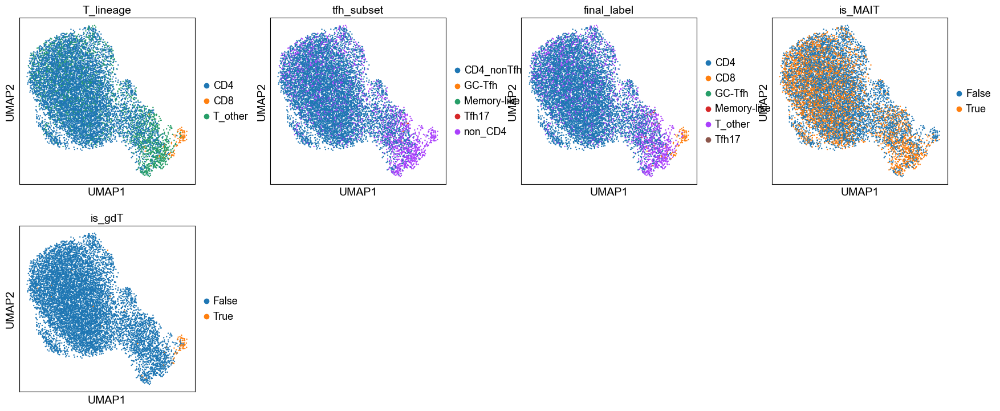

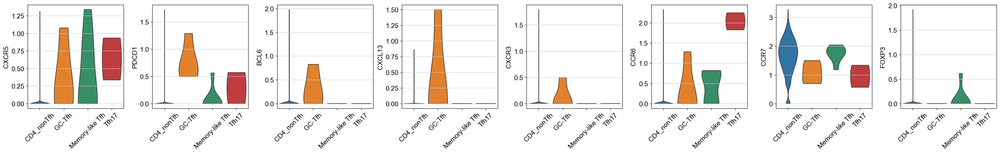

In [44]:
import pandas as pd
pd.crosstab(adata.obs["T_lineage"], adata.obs["tfh_subset"])

# UMAPs to show
sc.pl.umap(adata, color=["T_lineage","tfh_subset","final_label","is_MAIT","is_gdT"], wspace=0.3)

# Violin sanity checks within CD4
sc.pl.violin(adata[adata.obs["T_lineage"]=="CD4"],
             keys=["CXCR5","PDCD1","BCL6","CXCL13","CXCR3","CCR6","CCR7","FOXP3"],
             groupby="tfh_subset", stripplot=False, rotation=45)


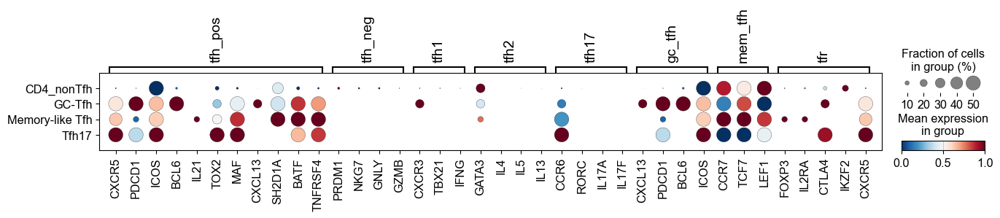

In [49]:
sc.pl.dotplot(
    adata[adata.obs["T_lineage"]=="CD4"],   # restrict to CD4 lineage
    var_names=tfh_panel,
    groupby="tfh_subset",
    standard_scale="var",   # scale each gene to highlight relative expression
    dot_max=0.5,            # max dot size (tune)
    color_map="RdBu_r"      # red/blue diverging
)

In [ ]:
tcell_markers = {
    "T_cells": ["CD3D", "CD3E", "CD3G", "TRAC", "TRBC1", "TRBC2"],
    
    "CD4_Naive": ["CD4", "CCR7", "SELL", "TCF7", "LEF1", "IL7R"],
    "CD4_Memory": ["IL7R", "ANXA1", "GZMK"],
    "Th1": ["TBX21", "IFNG", "CXCR3"],
    "Th2": ["GATA3", "IL4", "IL5", "IL13"],
    "Th17": ["RORC", "IL17A", "CCR6"],
    "Treg": ["FOXP3", "IL2RA", "CTLA4", "IKZF2"],
    "Tfh": ["CXCR5", "PDCD1", "ICOS", "BCL6", "IL21"],
    
    "CD8_Naive": ["CCR7", "SELL", "TCF7", "LEF1"],
    "CD8_Effector": ["GZMB", "PRF1", "GNLY", "NKG7", "IFNG"],
    "CD8_Memory": ["IL7R", "GZMK", "TCF7"],
    "CD8_Exhausted": ["PDCD1", "LAG3", "HAVCR2", "TIGIT", "TOX"],
    
    "GammaDelta": ["TRDC", "TRDV1", "TRGV9", "KLRD1"],
    
    "Activation": ["CD69", "FOS", "JUN", "NR4A1"],
    "Proliferation": ["MKI67", "TOP2A", "PCNA"]
}

In [56]:
sc.tl.score_genes(adata, gene_list=tcell_markers["Tfh"], score_name="Tfh_score")
for subtype, genes in tcell_markers.items():
    sc.tl.score_genes(adata, gene_list=genes, score_name=f"{subtype}_score")

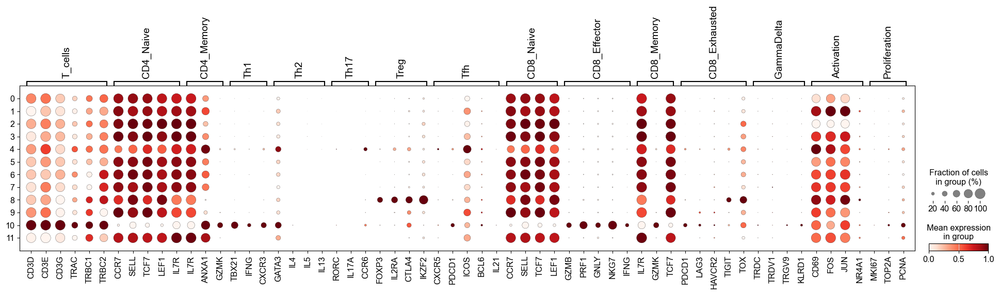

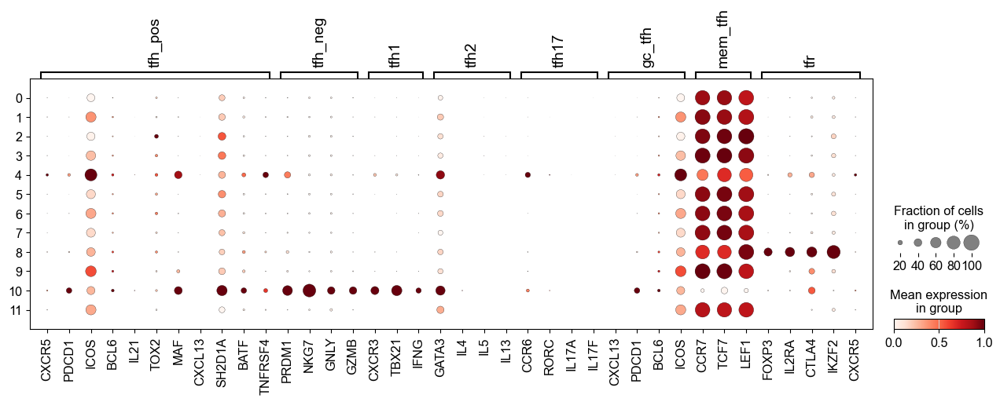

In [57]:
sc.pl.dotplot(adata, var_names=tcell_markers, groupby="leiden", standard_scale="var", save='batch1_tcell_dotplot.png')
sc.pl.dotplot(adata, tfh_panel, groupby="leiden", standard_scale="var", save='batch1_tfh_genes_dotplot.png')


In [58]:
for subset, genes in tfh_panel.items():
    sc.tl.score_genes(adata, gene_list=genes, score_name=f"{subset}_score")


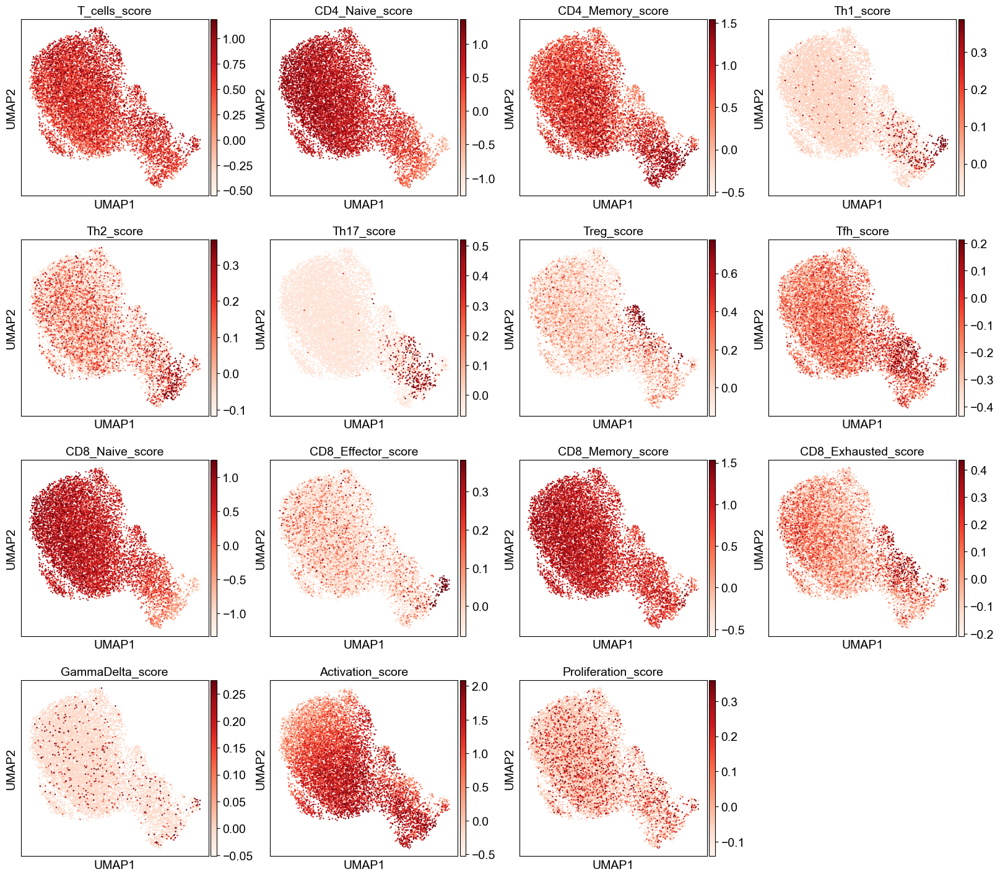

In [59]:
for subset, genes in tcell_markers.items():
    sc.tl.score_genes(adata, gene_list=genes, score_name=f"{subset}_score")

sc.pl.umap(adata, color=[f"{subset}_score" for subset in tcell_markers.keys()],
           cmap='Reds', vmax='p99', ncols=4)


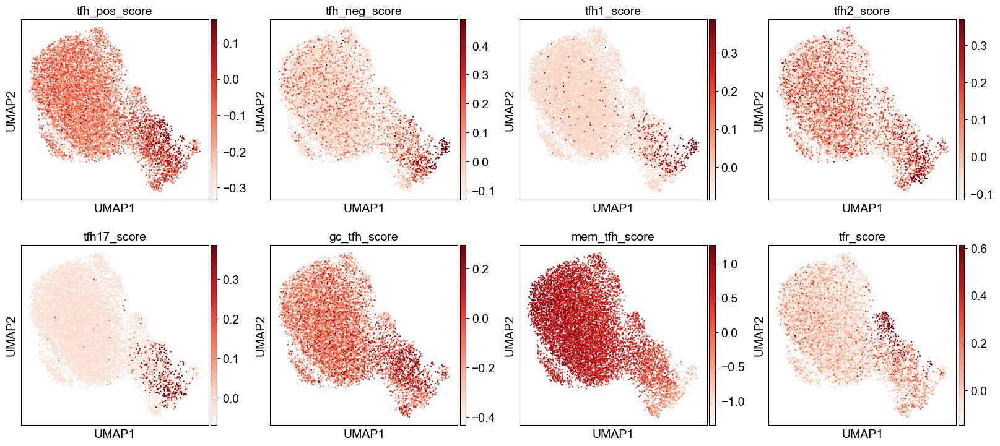

In [63]:
for subset, genes in tfh_panel.items():
    sc.tl.score_genes(adata, gene_list=genes, score_name=f"{subset}_score")

sc.pl.umap(adata, color=[f"{subset}_score" for subset in tfh_panel.keys()],
           cmap='Reds', vmax='p99', ncols=4)


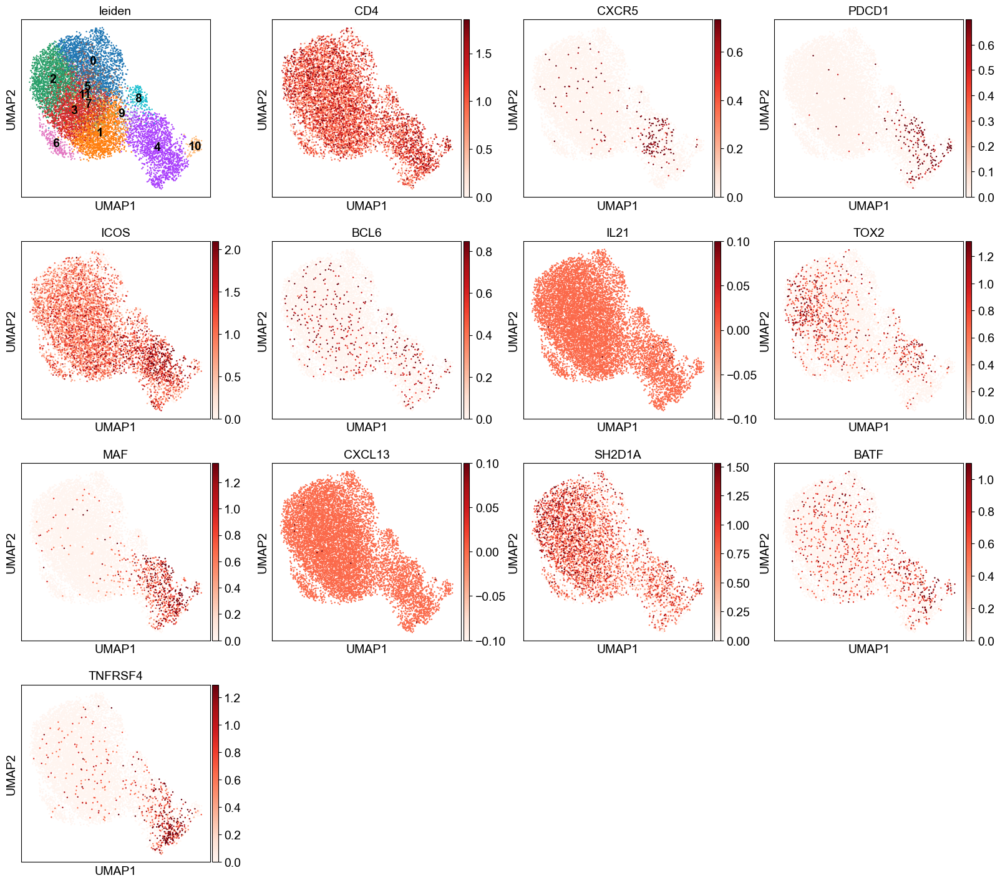

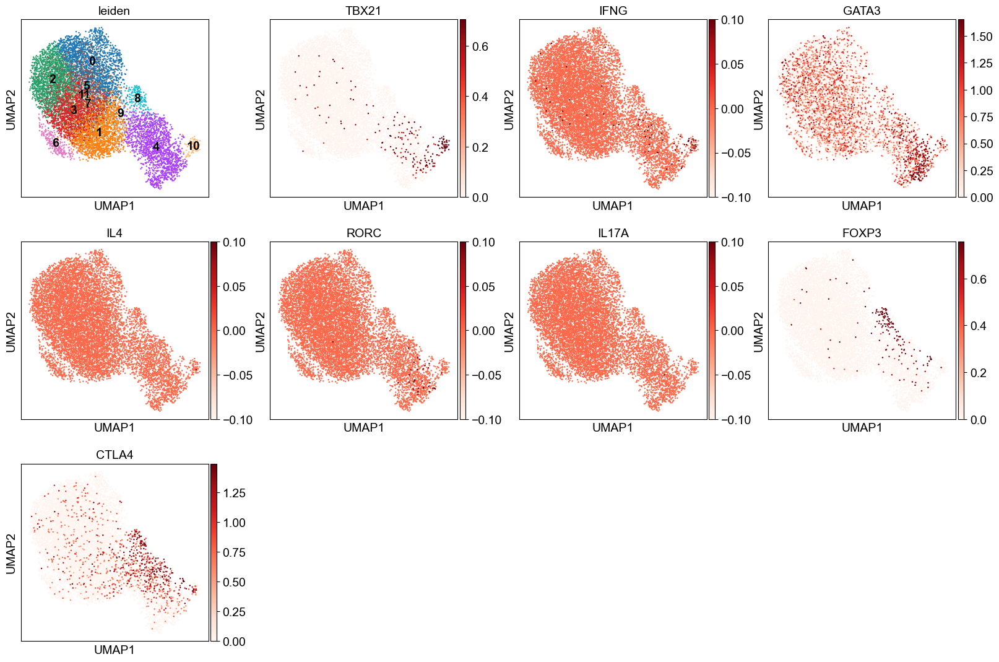

In [60]:


sc.pl.umap(adata, color=['leiden', 'CD4', 'CXCR5', 'PDCD1', 'ICOS', 'BCL6', 'IL21', 'TOX2', 'MAF', 'CXCL13', 'SH2D1A', 'BATF', 'TNFRSF4'], 
           legend_loc= 'on data', 
           cmap= 'Reds',
           vmax = 'p99', 
           save='batch1_pos_tfh_markers_umap.png')

sc.pl.umap(adata, color=['leiden', 'TBX21', 'IFNG', 'GATA3', 'IL4', 'RORC', 'IL17A', 'FOXP3', 'CTLA4'],
           legend_loc= 'on data', 
           cmap= 'Reds', 
           vmax = 'p99', 
           save='batch1_neg_tfh_markers_umap.png')


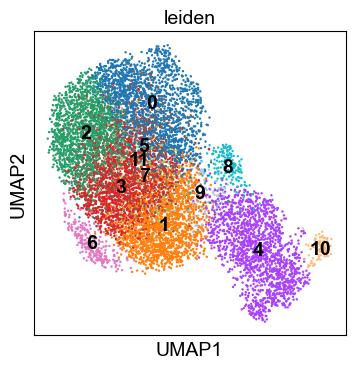

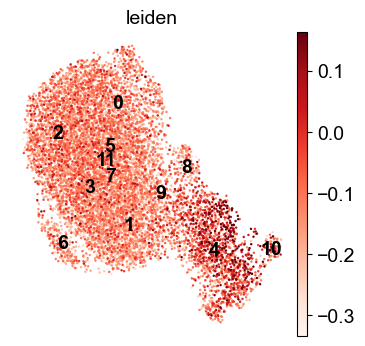

In [61]:

sc.tl.score_genes(adata, tfh_panel["tfh_pos"], score_name="TFH_score")

sc.pl.umap(
    adata,
    color=['leiden'],
    legend_loc='on data',
    cmap='Reds', vmax='p99'
)

ax = sc.pl.umap(
    adata, color='TFH_score',
    cmap='Reds', vmax='p99',
    frameon=False, show=False
)
# draw the same embedding again, but only to place cluster labels
sc.pl.umap(
    adata, color='leiden',
    legend_loc='on data',  # writes the cluster numbers on the cloud
    size=1.5, alpha=0.0,   # don't add extra points; just labels
    ax=ax, show=False
)
plt.show()

/var/folders/xb/gpl6jzb15493fwndpjblxyc40000gn/T/ipykernel_85053/2969961483.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('leiden')['TFH_score']


            mean    median  size
leiden                          
4      -0.053366 -0.070858  1577
10     -0.063074 -0.106181    78
9      -0.126195 -0.129981   130
8      -0.135988 -0.153367   176
0      -0.144574 -0.154001  1795
2      -0.146844 -0.153182  1681
3      -0.148668 -0.154340  1653
6      -0.151172 -0.159872   264
5      -0.153418 -0.160303   727
1      -0.159196 -0.165581  1691
7      -0.162076 -0.164880   219
11     -0.164981 -0.172806    68


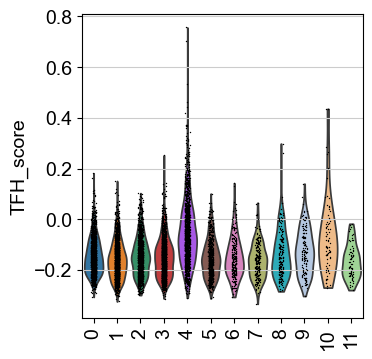

In [62]:
# mean/median TFH_score per Leiden cluster
summary = (
    adata.obs.groupby('leiden')['TFH_score']
    .agg(['mean','median','size'])
    .sort_values('mean', ascending=False)
)
print(summary)

# violin to see TFH_score distribution per cluster
sc.pl.violin(adata, keys='TFH_score', groupby='leiden', rotation=90)

In [32]:
cluster_annotations = {
    '0': 'Naive CD4+ T',
    '1': 'Th1',                
    '2': 'Central Memory',
    '3': 'Tfh',                
    '4': 'Activated T',
    '5': 'Transitional Tfh',
    '6': 'Th2/ILC-like',
    '7': 'Naive/Quiescent',
    '8': 'Th17',
    '9': 'Uncertain',
    '10': 'Treg',
}
adata.obs['celltype'] = adata.obs['leiden'].map(cluster_annotations)


saving figure to file figures/umapbatch1_tfh_annotations_umap.png


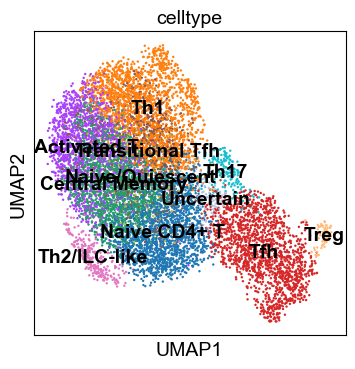

In [33]:
sc.pl.umap(adata, color='celltype', legend_loc='on data', save='batch1_tfh_annotations_umap.png')


## DEGs as Markers

saving figure to file figures/rank_genes_groups_leidenbatch1_leiden_rank_genes.png


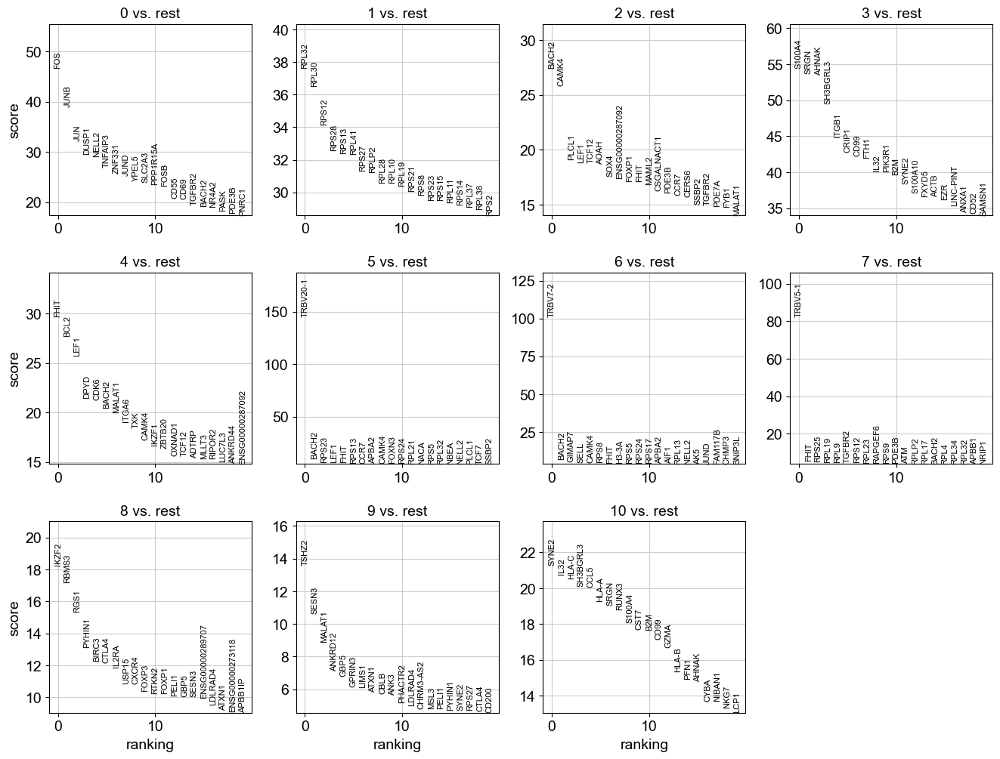

In [34]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False, save='batch1_leiden_rank_genes.png')


saving figure to file figures/rank_genes_groups_leidenleiden_rank_genes_batch1_0_1.png


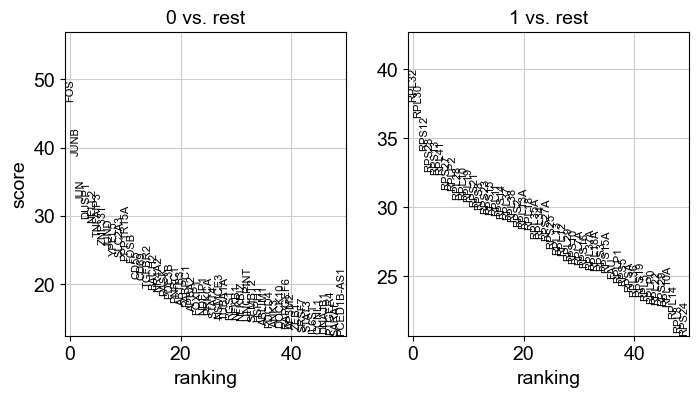

In [35]:
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=False, groups=['0','1'], save='leiden_rank_genes_batch1_0_1.png')

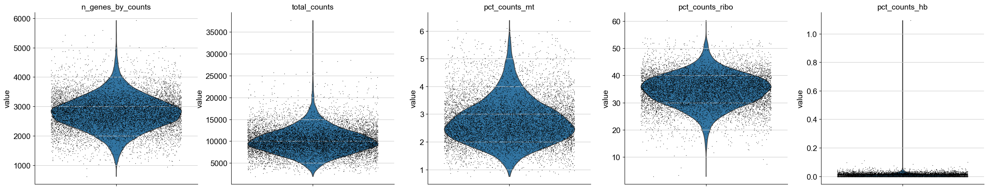

In [36]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb'], jitter=0.4, multi_panel=True)

In [37]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_1.0", standard_scale="var")

NameError: name 'marker_genes' is not defined

AGE


In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

DONOR_COL = "pica_id"  # or "pool_id" if that's what you use
adata.obs["donor_id"] = adata.obs[DONOR_COL].astype(str)  # <-- make it real in adata.obs

# if you don't have ages yet, use sequencing_batch as a temporary “group”
batch_per_donor = adata.obs.groupby("donor_id")["sequencing_batch"].first()
per_donor["age_group"] = per_donor["donor_id"].map(batch_per_donor)


# ------------- (optional) donor→age mapping -------------
# Create a dataframe mapping donor_id to age (years). Replace with your real values or read from CSV.
# Example:
# donor_age_map = pd.read_csv("donor_age_map.csv")  # columns: donor_id, age
donor_age_map = pd.DataFrame({
    "donor_id": adata.obs[DONOR_COL].unique(),
    "age": np.nan,  # fill in actual ages here; or merge from your metadata file
})


In [74]:
obs = adata.obs.copy()

# If you don't have T_lineage yet, make a soft CD4/CD8 gate using your t-cell subtype labels as a fallback
if "T_lineage" not in obs.columns:
    if "cell_type_02_t_cell_broad" in obs.columns:
        obs["T_lineage"] = np.where(obs["cell_type_02_t_cell_broad"].str.contains("CD4", case=False, na=False), "CD4",
                            np.where(obs["cell_type_02_t_cell_broad"].str.contains("CD8", case=False, na=False), "CD8", "T_other"))
    else:
        # very soft fallback: use 'cell_type' column
        obs["T_lineage"] = np.where(obs["cell_type"].str.contains("CD4", case=False, na=False), "CD4",
                            np.where(obs["cell_type"].str.contains("CD8", case=False, na=False), "CD8", "T_other"))

# Tfh flag: prefer tfh_subset if present; else use subtype strings containing "Tfh"
if "tfh_subset" in obs.columns:
    TFH_LABELS = {"Tfh1","Tfh2","Tfh17","GC-Tfh","Memory-like Tfh","Tfr"}
    obs["is_Tfh"] = obs["tfh_subset"].isin(TFH_LABELS)
else:
    # fallback if not created yet
    key = "cell_type_03_t_cell_subtype" if "cell_type_03_t_cell_subtype" in obs.columns else "cell_type"
    obs["is_Tfh"] = obs[key].str.contains("Tfh", case=False, na=False)

# Naive CD4 labels (adjust to your exact naming)
NAIVE_LABELS = {"Naive CD4", "Naive CD4 T", "Naive CD4+ T", "CD4 Naive"}
if "final_label" in obs.columns:
    obs["is_NaiveCD4"] = obs["final_label"].isin(NAIVE_LABELS)
else:
    key = "cell_type_03_t_cell_subtype" if "cell_type_03_t_cell_subtype" in obs.columns else "cell_type"
    obs["is_NaiveCD4"] = obs[key].str.contains("Naive", case=False, na=False) & (obs["T_lineage"]=="CD4")

# attach donor id
obs["donor_id"] = obs[DONOR_COL].astype(str)


In [75]:
obs_cd4 = obs[obs["T_lineage"]=="CD4"].copy()

per_donor_cd4 = (
    obs_cd4.groupby("donor_id")
           .agg(n_cd4=("donor_id","size"),
                tfh_cd4=("is_Tfh","sum"),
                naive_cd4=("is_NaiveCD4","sum"))
           .reset_index()
)
per_donor_cd4["tfh_frac_cd4"]   = per_donor_cd4["tfh_cd4"]   / per_donor_cd4["n_cd4"]
per_donor_cd4["naive_frac_cd4"] = per_donor_cd4["naive_cd4"] / per_donor_cd4["n_cd4"]


In [76]:
# merge age (if you have it)
per_donor = per_donor_cd4.merge(donor_age_map, left_on="donor_id", right_on="donor_id", how="left")

# Build age groups only if you have numeric age
if per_donor["age"].notna().any():
    per_donor["age_group"] = pd.cut(
        per_donor["age"].astype(float),
        bins=[-np.inf, 5, 12, 18, np.inf],
        labels=["0–5","6–12","13–18","19+"]
    )
else:
    # If you don't yet have age, you can temporarily group by sequencing batch or status to prototype the plot:
    per_donor["age_group"] = adata.obs.groupby("donor_id")["sequencing_batch"].first().reindex(per_donor["donor_id"]).values


In [77]:
def violin_by_group(df, value_col, group_col, title, outfile):
    groups = [g for g in pd.unique(df[group_col].dropna())]
    try:
        groups = sorted(groups, key=lambda x: str(x))
    except Exception:
        pass
    data = [df.loc[df[group_col]==g, value_col].dropna().values for g in groups]

    import matplotlib.pyplot as plt, numpy as np
    fig, ax = plt.subplots(figsize=(6,4))
    parts = ax.violinplot(data, showmeans=False, showmedians=True, showextrema=False)
    for pc in parts['bodies']: pc.set_alpha(0.6)

    # jittered donor points
    xs, ys = [], []
    for i, arr in enumerate(data, start=1):
        xs.extend(np.random.normal(i, 0.03, size=len(arr)))
        ys.extend(arr)
    ax.plot(xs, ys, 'k.', ms=4, alpha=0.6)

    ax.set_xticks(range(1, len(groups)+1))
    ax.set_xticklabels(groups)
    ax.set_ylim(0,1)
    ax.set_ylabel("Fraction")
    ax.set_title(title)
    plt.tight_layout()
    plt.savefig(outfile, dpi=300)
    plt.close(fig)

# Make both violins
violin_by_group(per_donor, "tfh_frac_cd4",   "age_group", "Tfh fraction within CD4 vs age",   "tfh_frac_cd4_by_age.png")
violin_by_group(per_donor, "naive_frac_cd4", "age_group", "Naive CD4 fraction within CD4 vs age", "naive_frac_cd4_by_age.png")
